# Baseball Stadium Attendance
## Problem Statement: can we predict the attendance at Houston Astros home baseball games at Minute Maid Park based on game details, rank, day, etc?

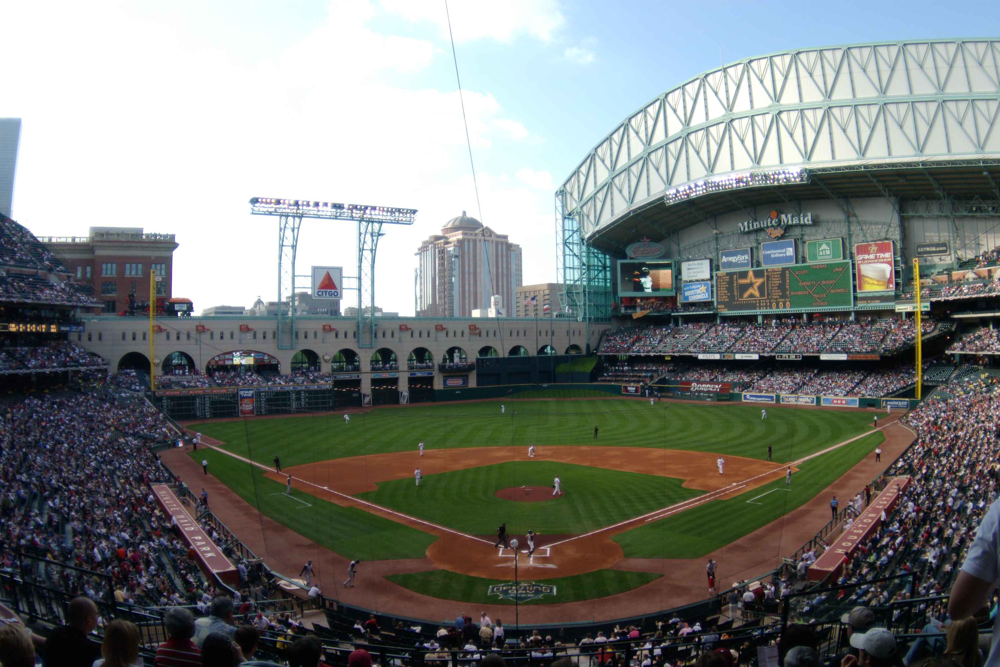

In [159]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Initialize

In [370]:
import pandas as pd
import sklearn
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

#Load Data

In [371]:
dfBsbl = pd.read_csv('/content/drive/MyDrive/BaseballDS/MinuteMaidPark4_17.csv')

dfBsbl.head()


,Gm#,Date,Opp,W/L,W-L,Rank,GB,D/N,Attendance,cLI,Streak,H Game #,Pitcher,Day,Year,Win Avg,League,Home Series #,Giveaway
0,1,"Monday, Apr 6",CLE,W,0-0,1,Tied,N,43753,0.90,+,1,Keuchel,M,2015,1.000000,Yes,1,No
1,2,"Wednesday, Apr 8",CLE,L,1-0,3,0.5,N,23078,0.97,+,2,Feldman,W,2015,1.000000,Yes,1,No
2,3,"Thursday, Apr 9",CLE,L,1-1,4,1,D,22593,0.97,-,3,Unknown,TH,2015,0.500000,Yes,1,No
3,7,"Monday, Apr 13",OAK,L,1-2,2,0.5,N,19279,1.12,--,4,Feldman,M,2015,0.333333,Yes,2,No
4,8,"Tuesday, Apr 14",OAK,L,3-4,3,1.5,N,18935,1.10,-,5,Peacock,T,2015,0.428571,Yes,2,No


In [372]:
# Select Target 
y = dfBsbl.loc[:,['Attendance']]
X = dfBsbl.drop(['Attendance'], axis = 1)

In [373]:
# Remove any (1) or (2) that show up in the 'Date' column
X['Date'] = X['Date'].str.replace(r'\s*\(.*\)\s*', '', regex=True)

# Import parse library to change 'Date' column into datetime format
from dateutil.parser import parse

# Apply the parse() function to each row of the 'Date' column
X['Date'] = X['Date'].apply(parse)

# Print the resulting dataframe
X.head()

,Gm#,Date,Opp,W/L,W-L,Rank,GB,D/N,cLI,Streak,H Game #,Pitcher,Day,Year,Win Avg,League,Home Series #,Giveaway
0,1,2023-04-06,CLE,W,0-0,1,Tied,N,0.90,+,1,Keuchel,M,2015,1.000000,Yes,1,No
1,2,2023-04-08,CLE,L,1-0,3,0.5,N,0.97,+,2,Feldman,W,2015,1.000000,Yes,1,No
2,3,2023-04-09,CLE,L,1-1,4,1,D,0.97,-,3,Unknown,TH,2015,0.500000,Yes,1,No
3,7,2023-04-13,OAK,L,1-2,2,0.5,N,1.12,--,4,Feldman,M,2015,0.333333,Yes,2,No
4,8,2023-04-14,OAK,L,3-4,3,1.5,N,1.10,-,5,Peacock,T,2015,0.428571,Yes,2,No


In [374]:
# Extract month, and day from 'Date' column
X['Month'] = X['Date'].dt.month

# Drop original 'Date' column
X.drop('Date', axis=1, inplace=True)

X.head()

,Gm#,Opp,W/L,W-L,Rank,GB,D/N,cLI,Streak,H Game #,Pitcher,Day,Year,Win Avg,League,Home Series #,Giveaway,Month
0,1,CLE,W,0-0,1,Tied,N,0.90,+,1,Keuchel,M,2015,1.000000,Yes,1,No,4
1,2,CLE,L,1-0,3,0.5,N,0.97,+,2,Feldman,W,2015,1.000000,Yes,1,No,4
2,3,CLE,L,1-1,4,1,D,0.97,-,3,Unknown,TH,2015,0.500000,Yes,1,No,4
3,7,OAK,L,1-2,2,0.5,N,1.12,--,4,Feldman,M,2015,0.333333,Yes,2,No,4
4,8,OAK,L,3-4,3,1.5,N,1.10,-,5,Peacock,T,2015,0.428571,Yes,2,No,4


Covid years (2020 and 2021 deleted from Data set to not alter the prediction)


# Part 1: Insights

In [375]:
# Scatter Plot with data
import seaborn as sns

## Plots


### With Day & Night Games Highlighted

<Axes: xlabel='H Game #', ylabel='Attendance'>

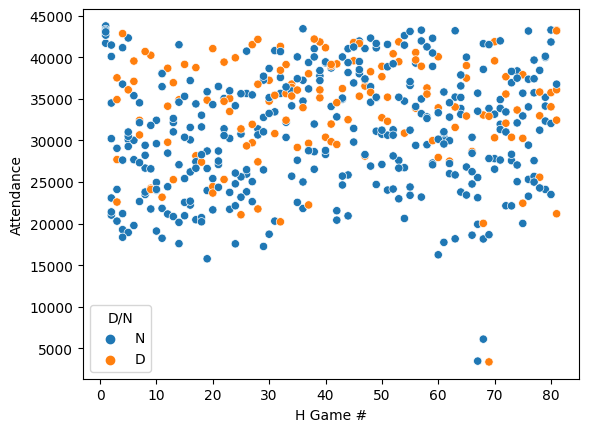

In [376]:
sns.scatterplot(x=dfBsbl['H Game #'], y=dfBsbl['Attendance'], hue=dfBsbl['D/N'])

INSIGHTS: We do see that Day games are slightly more likely to have higher attednace. As you can see, there's no real correlation between Day/Night games, the game number, and the attendance. 

<Axes: xlabel='H Game #', ylabel='Attendance'>

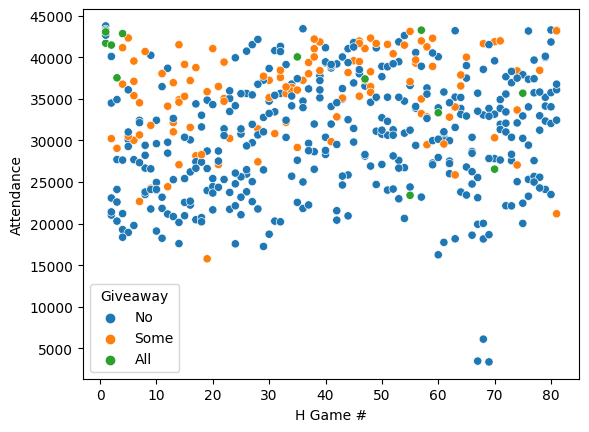

In [377]:
sns.scatterplot(x=dfBsbl['H Game #'], y=dfBsbl['Attendance'], hue=dfBsbl['Giveaway'])

<ipython-input-378-1875eb809f6c>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  AvgOpp = dfBsbl.groupby('Opp').mean()['Attendance']


[Text(0.5, 0, 'Opponent'), Text(0, 0.5, 'Attendance')]

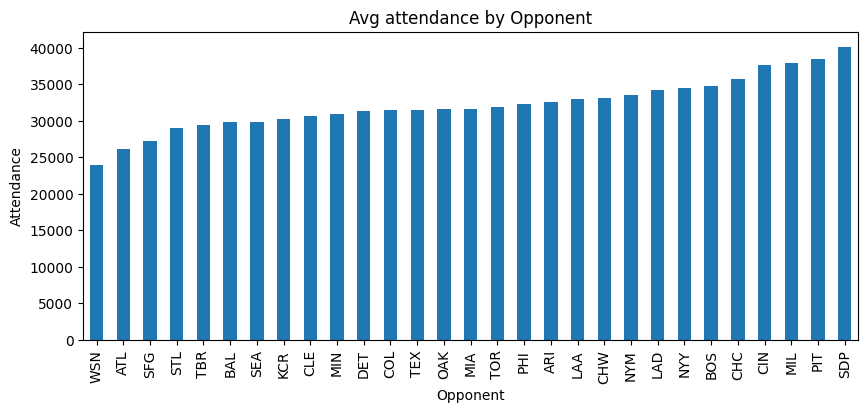

In [378]:
AvgOpp = dfBsbl.groupby('Opp').mean()['Attendance']

# Sort the values in ascending order
AvgOpp = AvgOpp.sort_values()

#Create a plot as the variable "ax"
ax = AvgOpp.plot(kind='bar',
               title="Avg attendance by Opponent",
               figsize = (10,4))
#Set axis labels for the "ax" plot
ax.set(xlabel='Opponent',
       ylabel='Attendance')

<ipython-input-379-e2feac8fed94>:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  AvgOpp = dfBsbl.groupby('Day').mean()['Attendance']


[Text(0.5, 0, 'Day of Week'), Text(0, 0.5, 'Attendance')]

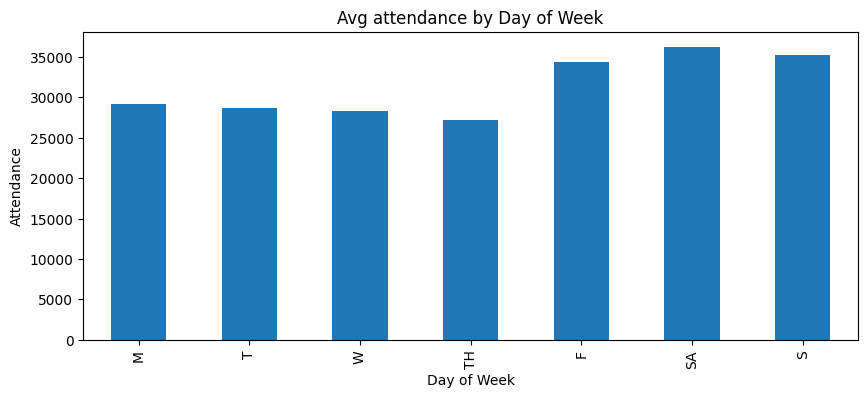

In [379]:
# Convert the 'Day' column to an ordered categorical variable
cat_type = pd.api.types.CategoricalDtype(categories=['M', 'T', 'W', 'TH', 'F', 'SA', 'S'], ordered=True)
dfBsbl['Day'] = dfBsbl['Day'].astype(cat_type)

# Calculate the average attendance by 'Day'
AvgOpp = dfBsbl.groupby('Day').mean()['Attendance']

# Sort the values based on the ordered categorical variable
AvgOpp = AvgOpp.sort_index()

# Create a plot as the variable "ax"
ax = AvgOpp.plot(kind='bar',
                 title="Avg attendance by Day of Week",
                 figsize=(10, 4))

# Set axis labels for the "ax" plot
ax.set(xlabel='Day of Week', ylabel='Attendance')

INSIGHTS: Uncorrelated features
- cLI
- Game #
- Pitcher
- Streak
- Past years: Rank


# Drop items that do not predict model

In [380]:
X = X.drop(['Streak'], axis = 1)
X = X.drop(['W/L'], axis = 1)
X = X.drop(['W-L'], axis = 1)
X = X.drop(['GB'], axis = 1)
X = X.drop(['Pitcher'], axis = 1)
X = X.drop(['Win Avg'], axis = 1)
X = X.drop(['cLI'], axis = 1)
X = X.drop(['League'], axis = 1)
X = X.drop(['Rank'], axis = 1)

In [381]:
X = X.drop(['Month'], axis = 1)
X = X.drop(['Gm#'], axis = 1)

# Check for Outliers


We found three outliers in the data. We can use the IQR method to identify the outliers.

In [382]:
# Calculate the boundaries of the boxplot
q1 = dfBsbl['Attendance'].quantile(0.25)
q3 = dfBsbl['Attendance'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)

# Identify the outliers
outliers = dfBsbl[(dfBsbl['Attendance'] < lower_bound) | (dfBsbl['Attendance'] > upper_bound)]

# Print the outliers
outliers

,Gm#,Date,Opp,W/L,W-L,Rank,GB,D/N,Attendance,cLI,Streak,H Game #,Pitcher,Day,Year,Win Avg,League,Home Series #,Giveaway
228,131,"Tuesday, Aug 29",TEX,L,77-50,1,up12.0,N,3485,0.10,-,67,Fiers,T,2017,0.606299,Yes,11,No
229,132,"Wednesday, Aug 30",TEX,L,79-52,1,up11.0,N,6123,0.13,-,68,Keuchel,W,2017,0.603053,Yes,11,No
230,133,"Thursday, Aug 31",TEX,W,79-53,1,up11.5,D,3385,0.17,--,69,Devenski,TH,2017,0.598485,Yes,11,No


It was interesting that the dates of the anomalies were so close together, and we figured that maybe the weather was quite bad. Upon further investigation, we realized that Hurricane Harvey was running through Houston at the time, explaining why attendance to these games was so low.

Given that the outliers were caused by an extreme weather event that is not a common occurrence, we found it reasonable to remove these anomalies from the data.

In [383]:
# Drop the outliers
dfBsbl = dfBsbl.drop(outliers.index)

# Impact:
- Concessions Inventory
- Ticket Prices
- Security/Staffing
- Uber Rides and Surge Pricing
- Other Sports
- Music Concerts/Festivals
- Convention Centers

# 2. Model

###Build Random Forest Model

Here we are using a Random Forest model. We believe a Random Forest model is appropriate because it is capable of modeling non-linear relationships and it is quite robust to overfitting and having to deal with scaling.

In [175]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=1)

In [176]:
cols_num = [col for col in X.columns if X[col].dtype in ['int64', 'float64']]
Xnum = X[cols_num]
Xnum.head()

,H Game #,Year,Home Series #
0,1,2015,1
1,2,2015,1
2,3,2015,1
3,4,2015,2
4,5,2015,2


In [177]:
cols_obj = [col for col in X.columns if X[col].dtype in ['object']]
cols_obj

['Opp', 'D/N', 'Day', 'Giveaway']

In [178]:
cols_cat = [col for col in X.columns if X[col].dtype in ['object'] and X[col].nunique()<85]
cols_cat

['Opp', 'D/N', 'Day', 'Giveaway']

In [179]:
# Label encoding on all non-numeric features
from sklearn import preprocessing

Xle_train = X_train.copy()
Xle_test = X_test.copy()

le = preprocessing.LabelEncoder()
for col in cols_cat:
  Xle_train[col] = le.fit_transform(X_train[col])
  Xle_test[col] = le.transform(X_test[col])

In [180]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

Would like to run more iterations of tuning but it took too long to run the model

In [181]:
from sklearn.ensemble import RandomForestRegressor

def get_random_forest_mae(X_trn,X_tst,y_trn,y_tst):
  md1RfsBsbl = RandomForestRegressor(random_state=1)
  md1RfsBsbl.fit(X_trn,y_trn)
  y_tst_prd = md1RfsBsbl.predict(X_tst)
  mae = mean_absolute_error(y_tst,y_tst_prd)
  return(mae)

In [182]:
print('MAE from Label Encoding all Categorical columns:')
print(get_random_forest_mae(Xle_train[cols_num + cols_cat], Xle_test[cols_num + cols_cat], y_train, y_test))

MAE from Label Encoding all Categorical columns:


<ipython-input-181-925a611a45e7>:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  md1RfsBsbl.fit(X_trn,y_trn)


2927.396621621621


In [183]:
Xle_test

,Opp,D/N,H Game #,Day,Year,Home Series #,Giveaway
353,4,1,30,6,2019,4,1
107,0,1,27,6,2016,5,1
165,22,1,4,5,2017,1,1
197,26,1,36,6,2017,6,2
324,18,1,1,0,2019,1,0
...,...,...,...,...,...,...,...
29,2,1,30,4,2015,5,1
172,11,0,11,5,2017,2,1
454,3,1,50,4,2022,8,1
410,27,0,6,2,2022,1,2


### Hyper parameter tuning

In [184]:
# initializing random forest
rf = RandomForestClassifier()
# random search cv

rs_space={'n_estimators':np.arange(5, 500, step=5),
              'max_features':np.arange(2, 6, step=1),
              'min_samples_leaf':np.arange(1, 5, step=1),
              'min_samples_split':np.arange(2, 6, step=1)
          }

rf = RandomForestClassifier()

rf_random = RandomizedSearchCV(rf, rs_space, n_iter=500, scoring='neg_mean_absolute_error', n_jobs=-1, cv=2)
model_random = rf_random.fit(Xle_train,y_train)

# random random search results
print('Best random search hyperparameters are: '+str(model_random.best_params_))

/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_search.py:909: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


Best random search hyperparameters are: {'n_estimators': 445, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 2}


In [224]:
from sklearn.ensemble import RandomForestRegressor

def random_forest_search_mae(X_trn,X_tst,y_trn,y_tst):
  md1RfsBsbl = RandomForestRegressor(n_estimators = 120, min_samples_split = 2, max_features = 4, bootstrap = 0)
  md1RfsBsbl.fit(X_trn,y_trn)
  y_tst_prd = md1RfsBsbl.predict(X_tst)
  mae = mean_absolute_error(y_tst,y_tst_prd)
  return(mae)

In [225]:
# Run Random Forest model on data with label encoded categorical features
print('MAE from Hypertuned parameters:')
print(random_forest_search_mae(Xle_train[cols_num + cols_cat], Xle_test[cols_num + cols_cat], y_train, y_test))

MAE from Hypertuned parameters:


/usr/local/lib/python3.9/dist-packages/sklearn/utils/_param_validation.py:558: FutureWarning: Passing an int for a boolean parameter is deprecated in version 1.2 and won't be supported anymore in version 1.4.
  warnings.warn(
<ipython-input-224-ab0ef8ce2017>:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  md1RfsBsbl.fit(X_trn,y_trn)


2925.647072072072


This performed worse than before hyperparameter tuning. The model may be overfitting to the training set.

# 3. Prediction

#Data

In [359]:
dfMMTest = pd.read_csv('/content/drive/MyDrive/BaseballDS/MinuteMaidParkTest.csv')

dfMMTest.head()


,Gm#,Date,Opp,W/L,W-L,Rank,GB,D/N,Attendance,cLI,Streak,H Game #,Pitcher,Day,Year,Win Avg,League,Home Series #,Giveaway
0,6,"Tuesday, Apr 4",DET,L,2-4,4,1.5,N,30613,0.87,---,6.00,Valdez,T,2023,0.333333,Yes,1,No
1,7,"Wednesday, Apr 5",DET,W,3-4,3,1.5,D,37932,0.84,+,7.00,Javier,W,2023,0.428571,Yes,1,All
2,14,"Friday, Apr 14",TEX,L,6-7,3,2.5,N,39343,0.98,+,0.98,Garcia,F,2023,0.857143,Yes,2,Some
3,15,"Saturday, Apr 15",TEX,W,6-8,3,1.5,N,39257,0.96,-,0.96,Brown,SA,2023,0.750000,Yes,2,Some
4,16,"Sunday, Apr 16",TEX,L,7-8,4,2.5,N,39122,0.98,+,0.98,Valdez,S,2023,0.875000,Yes,2,Some


#Clean New Data

In [360]:
dfMMTest.dtypes

Gm#                int64
Date              object
Opp               object
W/L               object
W-L               object
Rank               int64
GB               float64
D/N               object
Attendance         int64
cLI              float64
Streak            object
H Game #         float64
Pitcher           object
Day               object
Year               int64
Win Avg          float64
League            object
Home Series #      int64
Giveaway          object
dtype: object

In [361]:
# Remove any (1) or (2) that show up in the 'Date' column
dfMMTest['Date'] = dfMMTest['Date'].str.replace(r'\s*\(.*\)\s*', '', regex=True)
# Import parse library to change 'Date' column into datetime format
from dateutil.parser import parse
# Apply the parse() function to each row of the 'Date' column
dfMMTest['Date'] = dfMMTest['Date'].apply(parse)
# Extract month, and day from 'Date' column
dfMMTest['Month'] = dfMMTest['Date'].dt.month
# Drop original 'Date' column
dfMMTest.drop('Date', axis=1, inplace=True)

In [362]:
# Select Target 
yt = dfMMTest.loc[:,['Attendance']]
Xt = dfMMTest.drop(['Streak'], axis = 1)
Xt = Xt.drop(['Attendance'], axis = 1)
Xt = Xt.drop(['W/L'], axis = 1)
Xt = Xt.drop(['W-L'], axis = 1)
Xt = Xt.drop(['GB'], axis = 1)
#Xt = Xt.drop(['Month'], axis = 1)
Xt = Xt.drop(['Pitcher'], axis = 1)
Xt = Xt.drop(['Win Avg'], axis = 1)
Xt = Xt.drop(['cLI'], axis = 1)
Xt = Xt.drop(['League'], axis = 1)
Xt = Xt.drop(['Rank'], axis = 1)
Xt = Xt.drop(['Month'], axis = 1)
Xt = Xt.drop(['Gm#'], axis = 1)

In [363]:
cols_num_t = [col_t for col_t in Xt.columns if Xt[col_t].dtype in ['int64', 'float64']]
Xtnum = Xt[cols_num_t]
Xtnum.head()

,H Game #,Year,Home Series #
0,6.00,2023,1
1,7.00,2023,1
2,0.98,2023,2
3,0.96,2023,2
4,0.98,2023,2


In [364]:
cols_obj_t = [col_t for col_t in Xt.columns if Xt[col_t].dtype in ['object']]
cols_obj_t

['Opp', 'D/N', 'Day', 'Giveaway']

In [365]:
cols_cat_t = [col_t for col_t in Xt.columns if Xt[col_t].dtype in ['object'] and Xt[col_t].nunique()<30]
cols_cat_t

['Opp', 'D/N', 'Day', 'Giveaway']

In [366]:
# Label encoding on all non-numeric features in Test
from sklearn import preprocessing

Xle_t = Xt.copy()

le = preprocessing.LabelEncoder()

for col in cols_cat_t:
  Xle_t[col] = le.fit_transform(Xle_t[col])

In [367]:
# Run Random Forest model on data with label encoded categorical features
print('MAE from Label Encoding all Categorical columns:')
print(get_random_forest_mae(Xle_train[cols_num + cols_cat], Xle_t[cols_num_t + cols_cat_t], y_train, yt))

MAE from Label Encoding all Categorical columns:


<ipython-input-181-925a611a45e7>:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  md1RfsBsbl.fit(X_trn,y_trn)


2072.4120000000003


In [368]:
  md1RfsBsbl = RandomForestRegressor(random_state=1, n_estimators = 120)
  md1RfsBsbl.fit(Xle_train[cols_num + cols_cat],y_train)
  y_test_pred = md1RfsBsbl.predict(Xle_t[cols_num + cols_cat])

<ipython-input-368-73045addfad3>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  md1RfsBsbl.fit(Xle_train[cols_num + cols_cat],y_train)


# Real Time Prediction

In [387]:
#yt.insert(1, "Predicted Attendance", y_test_pred)
print(yt)


   Attendance  Predicted Attendance
0       30613          34654.858333
1       37932          33018.591667
2       39343          39436.566667
3       39257          38614.183333
4       39122          38793.500000


# Sensibility

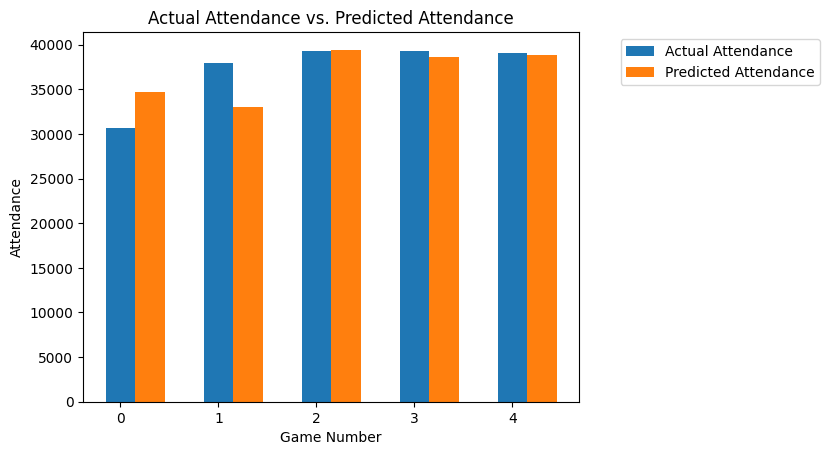

In [354]:
# Sample data
data = np.array([['0', dfMMTest.loc[0, 'Attendance'], y_test_pred[0] ], ['1', dfMMTest.loc[1, 'Attendance'],y_test_pred[1]],['2', dfMMTest.loc[2, 'Attendance'],y_test_pred[2] ],['3', dfMMTest.loc[3, 'Attendance'],y_test_pred[3]  ],['4', dfMMTest.loc[4, 'Attendance'],y_test_pred[4] ]])

categories = data[:,0]
Actual_Attendance = data[:,1].astype(int)
Predicted_Attendance = data[:,2].astype(float)



fig, ax = plt.subplots(nrows=1, ncols=1)

ax.set_xticks(np.arange(len(categories)))
ax.set_xticklabels(categories)

width = 0.30

ax.bar(np.arange(len(categories)), Actual_Attendance, width, label='Actual Attendance')
ax.bar(np.arange(len(categories)) + width, Predicted_Attendance, width, label='Predicted Attendance')

# Set the axis labels and title
ax.set_xlabel('Game Number')
ax.set_ylabel('Attendance')
ax.set_title('Actual Attendance vs. Predicted Attendance')

# Add a legend
ax.legend(loc='upper right', bbox_to_anchor=(1.5, 1))

plt.show()

In [355]:
#percent error calculation

Percent_Error_1 = abs(dfMMTest.loc[0, 'Attendance']- y_test_pred[0])/(dfMMTest.loc[0, 'Attendance'])*100
Percent_Error_2 = abs(dfMMTest.loc[1, 'Attendance']- y_test_pred[1])/(dfMMTest.loc[1, 'Attendance'])*100
Percent_Error_3 = abs(dfMMTest.loc[2, 'Attendance']- y_test_pred[2])/(dfMMTest.loc[2, 'Attendance'])*100
Percent_Error_4 = abs(dfMMTest.loc[3, 'Attendance']- y_test_pred[3])/(dfMMTest.loc[3, 'Attendance'])*100
Percent_Error_5 = abs(dfMMTest.loc[4, 'Attendance']- y_test_pred[4])/(dfMMTest.loc[4, 'Attendance'])*100

print('Game',"","", 'Percent Error')
print('0',"","","", Percent_Error_1,'%' )
print('1',"","","", Percent_Error_2,'%' )
print('2',"","","", Percent_Error_3,'%' )
print('3',"","","", Percent_Error_4,'%' )
print('4',"","","", Percent_Error_5,'%' )



Game   Percent Error
0    13.203078212959623 %
1    12.953201342753697 %
2    0.2378229079294047 %
3    1.6374574385884446 %
4    0.8396809979039928 %


In [ ]:
dfMMTest.head()

,Gm#,Opp,W/L,W-L,Rank,GB,D/N,Attendance,cLI,Streak,H Game #,Pitcher,Day,Year,Win Avg,League,Home Series #,Giveaway,Month
0,6,DET,L,2-4,4,1.5,N,30613,0.87,---,6.00,Valdez,T,2023,0.333333,Yes,1,No,4
1,7,DET,W,3-4,3,1.5,D,37932,0.84,+,7.00,Javier,W,2023,0.428571,Yes,1,All,4
2,14,TEX,L,6-7,3,2.5,N,39343,0.98,+,0.98,Garcia,F,2023,0.857143,Yes,2,Some,4
3,15,TEX,W,6-8,3,1.5,N,39257,0.96,-,0.96,Brown,SA,2023,0.750000,Yes,2,Some,4
4,16,TEX,L,7-8,4,2.5,N,39122,0.98,+,0.98,Valdez,S,2023,0.875000,Yes,2,Some,4
